Integrantes: Jaquelyne de la Torre, Josefa Ferreira, Javiera Soto

## Modelo Inicial


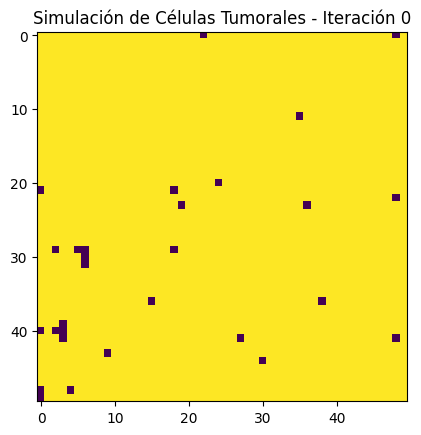

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
import networkx as nx  # Para definir las interacciones entre células
from IPython.display import HTML  # Convertir la animación en HTML para que la animación se reproduzca
from matplotlib.animation import FuncAnimation  # Para generar una animación de las iteraciones

# Definición del entorno
grid_size = 50  # Tamaño de la cuadrícula (50x50)
timesteps = 100  # Número de iteraciones de la simulación

# Definición de los estados de las células
EMPTY = 0
CANCER = 1
DEAD = 2

# Creación de la cuadrícula
grid = np.zeros((grid_size, grid_size), dtype=int)

# Inicialización con algunas células cancerígenas
for _ in range(5):  # Se eligen 5 posiciones iniciales de células cancerígenas al azar
    x, y = random.randint(0, grid_size - 1), random.randint(0, grid_size - 1)
    grid[x, y] = CANCER

# Creación del grafo para representar la conectividad entre las células
# Crea un grafo bidimensional en forma de cuadrícula.
# Esto significa que está creando un conjunto de puntos (nodos) organizados como una cuadrícula
G = nx.grid_2d_graph(grid_size, grid_size)

# Función para obtener vecinos de una célula
def get_neighbors(x, y, grid):
    neighbors = []  # Se crea una lista que almacenará las coordenadas de las células vecinas.
    for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:  # Vecinos ortogonales
        # Aquí se está recorriendo una lista de desplazamientos (dx, dy)
        # que representan las posiciones de los vecinos ortogonales
        # (es decir, los vecinos directamente arriba, abajo, a la izquierda y a la derecha).
        # (-1, 0) se refiere al vecino arriba de la célula actual.
        # (1, 0) se refiere al vecino abajo de la célula actual.
        # (0, -1) se refiere al vecino a la izquierda.
        # (0, 1) se refiere al vecino a la derecha.
        if 0 <= x + dx < grid_size and 0 <= y + dy < grid_size:  # Esta condición se asegura de que las coordenadas del vecino calculadas (x + dx, y + dy) estén dentro de los límites de la cuadrícula.
            neighbors.append((x + dx, y + dy))  # Si el vecino está dentro de los límites, se agrega su posición (como un par de coordenadas (x + dx, y + dy)) a la lista neighbors.
    return neighbors

# Reglas de actualización con consenso
def update_grid(grid):
    new_grid = np.copy(grid)  # Copia de la cuadrícula grid actual para modificar el estado de las células sin alterar la cuadrícula original hasta que todos los cambios estén listos.
    for x in range(grid_size):  # Se recorre cada posición de la cuadrícula (x, y), representando cada célula.
        for y in range(grid_size):
            if grid[x, y] == CANCER:  # Se verifica si la célula actual (grid[x, y]) está en estado CANCER. Si es así, se aplican las reglas de actualización específicas para células cancerígenas.
                # Probabilidad de muerte
                if random.random() < 0.1:  # 10% probabilidad de morir. Se utiliza una probabilidad del 10% para determinar si una célula cancerígena muere.
                    new_grid[x, y] = DEAD  # Si el valor generado aleatoriamente (random.random()) es menor que 0.1, la célula se cambia al estado DEAD (muerta)
                else:  # Si no muere…
                    # Intentar replicarse a una celda vacía adyacente
                    neighbors = get_neighbors(x, y, grid)  # Se obtiene una lista de las posiciones de sus vecinos (get_neighbors(x, y, grid)).
                    empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]  # Luego se filtran los vecinos vacíos (EMPTY) en empty_neighbors.
                    if empty_neighbors and random.random() < 0.3:  # 30% probabilidad de replicarse.
                        nx, ny = random.choice(empty_neighbors)  # Si hay vecinos vacíos y se cumple una probabilidad del 30%,
                        new_grid[nx, ny] = CANCER  # La célula se replica en una de las celdas vacías seleccionada aleatoriamente.

                    # Consenso: Ajustar comportamiento basado en vecinos
                    cancer_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == CANCER]
                    if len(cancer_neighbors) >= 2:  # Si tiene al menos 2 vecinos cancerígenos
                        # Incrementar la probabilidad de replicarse
                        if empty_neighbors and random.random() < 0.5:  # Si hay vecinos vacíos disponibles y se cumple una probabilidad del 50%,
                            nx, ny = random.choice(empty_neighbors)
                            new_grid[nx, ny] = CANCER  # La célula se replica en una de las posiciones vacías.
            elif grid[x, y] == DEAD:
                # Las células muertas permanecen muertas. Si la célula está en el estado DEAD, no cambia su estado. Permanece muerta.
                pass
    return new_grid  # Finalmente, se retorna la cuadrícula actualizada (new_grid) después de aplicar todas las reglas a cada célula.

# Función de animación
def animate(t):
    global grid  # Se declara la cuadrícula como global para modificarla dentro de la función.
    grid = update_grid(grid)  # Actualiza la cuadrícula llamando a la función update_grid.
    cax.set_data(grid)  # Actualiza los datos del gráfico con la nueva cuadrícula.
    ax.set_title(f"Simulación de Células Tumorales - Iteración {t}")  # Actualiza el título del gráfico para mostrar la iteración actual.
    return cax,  # Retorna la imagen actualizada para la animación.

# Simulación con animación compatible con Jupyter Notebook
fig, ax = plt.subplots()  # Crea una figura y un eje para la gráfica.
cax = ax.imshow(grid, cmap="viridis", interpolation="nearest")  # Muestra la cuadrícula inicial usando un mapa de colores.
ani = FuncAnimation(fig, animate, frames=timesteps, interval=100, blit=False)  # Crea la animación de la simulación usando la función animate.

# Mostrar la animación en Jupyter Notebook
HTML(ani.to_jshtml())  # Convierte la animación en HTML para que se pueda reproducir dentro del entorno de Jupyter Notebook.


## Complejización del modelo


#### Crear un mapa de nutrientes:

- Podemos crear una segunda cuadrícula que represente la disponibilidad de nutrientes en cada celda del grid.
La cantidad de nutrientes en cada celda podría ser inicializada aleatoriamente, y tal vez variar con el tiempo (por ejemplo, disminuir a medida que las células lo consumen).
Agregar un umbral de nutrientes para la proliferación:

- Cuando una célula tumorosa intente replicarse, se verificará el nivel de nutrientes en la celda objetivo. Solo si hay suficientes nutrientes la célula podrá reproducirse.
También podríamos permitir que las células consuman nutrientes al replicarse, lo que implica que la disponibilidad de nutrientes podría ir disminuyendo en áreas con alta concentración de células tumorales.
Gradiente de nutrientes:

- Podríamos implementar un gradiente de nutrientes, donde ciertas partes del grid tengan una mayor concentración de nutrientes y otras menos. Esto permitiría simular cómo las células tienden a expandirse hacia áreas con mayor cantidad de recursos.
Difusión de nutrientes:

- Los nutrientes podrían también tener un comportamiento similar al de la difusión, moviéndose a las celdas vecinas y proporcionando un ambiente más realista en el que los nutrientes fluyen y se distribuyen, similar a cómo se comportan los nutrientes en el tejido real.



- Amarillo para células tumorales (CANCER).
- Morado (por defecto) para las celdas vacías (EMPTY).
     * Morado claro 0% de nutrientes
     * Morado 50% nutrientes
     * Morado oscuro 100% nutrientes
  

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
import networkx as nx  # Para definir las interacciones entre células
from IPython.display import HTML  # Convertir la animación en HTML para que la animación se reproduzca
from matplotlib.animation import FuncAnimation  # Para generar una animación de las iteraciones

# Definición del entorno
grid_size = 50  # Tamaño de la cuadrícula (50x50)
timesteps = 100  # Número de iteraciones de la simulación

# Definición de los estados de las células
EMPTY = 0
CANCER = 1
DEAD = 2

# Creación de la cuadrícula
grid = np.zeros((grid_size, grid_size), dtype=int)

# Creación del mapa de nutrientes
grid_nutrients = np.random.choice([0.0, 0.5, 1.0], (grid_size, grid_size))  # Inicialización con valores de 0%, 50%, y 100% de nutrientes
nutrient_threshold = 0.5  # Umbral de nutrientes para que una célula pueda replicarse

# Inicialización con algunas células cancerígenas
for _ in range(5):  # Se eligen 5 posiciones iniciales de células cancerígenas al azar
    x, y = random.randint(0, grid_size - 1), random.randint(0, grid_size - 1)
    grid[x, y] = CANCER

# Creación del grafo para representar la conectividad entre las células
# Crea un grafo bidimensional en forma de cuadrícula.
# Esto significa que está creando un conjunto de puntos (nodos) organizados como una cuadrícula
G = nx.grid_2d_graph(grid_size, grid_size)

# Función para obtener vecinos de una célula
def get_neighbors(x, y, grid):
    neighbors = []  # Se crea una lista que almacenará las coordenadas de las células vecinas.
    for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:  # Vecinos ortogonales
        # Aquí se está recorriendo una lista de desplazamientos (dx, dy)
        # que representan las posiciones de los vecinos ortogonales
        # (es decir, los vecinos directamente arriba, abajo, a la izquierda y a la derecha).
        # (-1, 0) se refiere al vecino arriba de la célula actual.
        # (1, 0) se refiere al vecino abajo de la célula actual.
        # (0, -1) se refiere al vecino a la izquierda.
        # (0, 1) se refiere al vecino a la derecha.
        if 0 <= x + dx < grid_size and 0 <= y + dy < grid_size:  # Esta condición se asegura de que las coordenadas del vecino calculadas (x + dx, y + dy) estén dentro de los límites de la cuadrícula.
            neighbors.append((x + dx, y + dy))  # Si el vecino está dentro de los límites, se agrega su posición (como un par de coordenadas (x + dx, y + dy)) a la lista neighbors.
    return neighbors

# Reglas de actualización con consenso y disponibilidad de nutrientes
def update_grid(grid, grid_nutrients):
    new_grid = np.copy(grid)  # Copia de la cuadrícula grid actual para modificar el estado de las células sin alterar la cuadrícula original hasta que todos los cambios estén listos.
    new_nutrients = np.copy(grid_nutrients)  # Copia del mapa de nutrientes para actualizarlo sin alterar el original inmediatamente.
    for x in range(grid_size):  # Se recorre cada posición de la cuadrícula (x, y), representando cada célula.
        for y in range(grid_size):
            if grid[x, y] == CANCER:  # Se verifica si la célula actual (grid[x, y]) está en estado CANCER. Si es así, se aplican las reglas de actualización específicas para células cancerígenas.
                # Probabilidad de muerte
                if random.random() < 0.1:  # 10% probabilidad de morir. Se utiliza una probabilidad del 10% para determinar si una célula cancerígena muere.
                    new_grid[x, y] = DEAD  # Si el valor generado aleatoriamente (random.random()) es menor que 0.1, la célula se cambia al estado DEAD (muerta)
                else:  # Si no muere…
                    # Intentar replicarse a una celda vacía adyacente
                    neighbors = get_neighbors(x, y, grid)  # Se obtiene una lista de las posiciones de sus vecinos (get_neighbors(x, y, grid)).
                    empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]  # Luego se filtran los vecinos vacíos (EMPTY) en empty_neighbors.
                    if empty_neighbors:
                        nx, ny = random.choice(empty_neighbors)  # Selecciona aleatoriamente una de las celdas vacías.
                        if grid_nutrients[nx, ny] >= nutrient_threshold and random.random() < 0.3:  # 30% probabilidad de replicarse si hay suficientes nutrientes.
                            new_grid[nx, ny] = CANCER  # La célula se replica en una de las celdas vacías seleccionada aleatoriamente.
                            new_nutrients[nx, ny] = max(new_nutrients[nx, ny] - 0.5, 0)  # Se reduce la cantidad de nutrientes en la celda donde se replicó la célula, en pasos de 50%.

                    # Consenso: Ajustar comportamiento basado en vecinos
                    cancer_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == CANCER]
                    if len(cancer_neighbors) >= 2:  # Si tiene al menos 2 vecinos cancerígenos
                        # Incrementar la probabilidad de replicarse
                        if empty_neighbors and grid_nutrients[nx, ny] >= nutrient_threshold and random.random() < 0.5:  # Si hay vecinos vacíos y suficientes nutrientes, probabilidad de replicarse.
                            nx, ny = random.choice(empty_neighbors)
                            new_grid[nx, ny] = CANCER  # La célula se replica en una de las posiciones vacías.
                            new_nutrients[nx, ny] = max(new_nutrients[nx, ny] - 0.5, 0)  # Se reduce la cantidad de nutrientes.
            elif grid[x, y] == DEAD:
                # Las células muertas permanecen muertas. Si la célula está en el estado DEAD, no cambia su estado. Permanece muerta.
                pass
    return new_grid, new_nutrients  # Finalmente, se retorna la cuadrícula actualizada (new_grid) y el mapa de nutrientes actualizado (new_nutrients) después de aplicar todas las reglas a cada célula.

# Función de animación
def animate(t):
    global grid, grid_nutrients  # Se declara la cuadrícula y el mapa de nutrientes como global para modificarlos dentro de la función.
    grid, grid_nutrients = update_grid(grid, grid_nutrients)  # Actualiza la cuadrícula y el mapa de nutrientes llamando a la función update_grid.
    cax.set_data(grid)  # Actualiza los datos del gráfico con la nueva cuadrícula.
    nutrients_overlay.set_data(grid_nutrients)  # Actualiza la capa de nutrientes con la nueva distribución.
    ax.set_title(f"Simulación de Células Tumorales - Iteración {t}")  # Actualiza el título del gráfico para mostrar la iteración actual.
    return cax, nutrients_overlay  # Retorna la imagen actualizada para la animación.

# Simulación con animación compatible con Jupyter Notebook
fig, ax = plt.subplots()  # Crea una figura y un eje para la gráfica.
cax = ax.imshow(grid, cmap="viridis", interpolation="nearest")  # Muestra la cuadrícula inicial usando un mapa de colores.
nutrients_overlay = ax.imshow(grid_nutrients, cmap="Purples", alpha=0.5, interpolation="nearest", vmin=0, vmax=1)  # Capa semitransparente para visualizar los nutrientes con tres niveles: 0%, 50%, 100%.
ani = FuncAnimation(fig, animate, frames=timesteps, interval=100, blit=False)  # Crea la animación de la simulación usando la función animate.

# Mostrar la animación en Jupyter Notebook
HTML(ani.to_jshtml())  # Convierte la animación en HTML para que se pueda reproducir dentro del entorno de Jupyter Notebook.


Rojo: celulas cancerigenas mutadas: no mueren y tienen 70% de probabilidad de proliferar
Rosado: células sanas
Negro/gris: células muertas

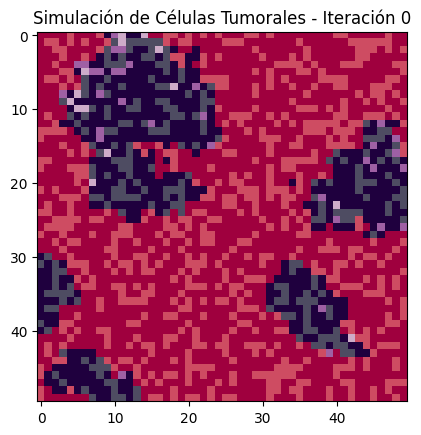

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import random
import networkx as nx  # Para definir las interacciones entre células
from IPython.display import HTML  # Convertir la animación en HTML para que la animación se reproduzca
from matplotlib.animation import FuncAnimation  # Para generar una animación de las iteraciones
import matplotlib.colors as mcolors  # Para definir un colormap personalizado

# Definición del entorno
grid_size = 50  # Tamaño de la cuadrícula (50x50)
timesteps = 100  # Número de iteraciones de la simulación

# Definición de los estados de las células
EMPTY = 0
CANCER = 1
HEALTHY = 2
DEAD = 3
MUTATED_CANCER = 4  # Nuevo estado para células cancerígenas mutadas

# Creación de la cuadrícula
grid = np.zeros((grid_size, grid_size), dtype=int)

# Creación del mapa de nutrientes
grid_nutrients = np.random.choice([0.5, 1.0, 1.5], (grid_size, grid_size))  # Inicialización con valores de 50%, 100%, y 150% de nutrientes para favorecer la replicación
nutrient_threshold = 0.4  # Umbral de nutrientes ajustado para favorecer la replicación

# Creación de un contador de inmunidad para células cancerígenas
immunity_counter = np.zeros((grid_size, grid_size), dtype=int)
immune_period = 10  # Número de iteraciones durante las cuales las células recién replicadas tienen inmunidad

# Inicialización con algunas células cancerígenas y saludables
for _ in range(3):  # Se eligen 3 posiciones iniciales de células cancerígenas al azar
    x, y = random.randint(0, grid_size - 1), random.randint(0, grid_size - 1)
    grid[x, y] = CANCER
    immunity_counter[x, y] = immune_period  # Inicializar con periodo de inmunidad

for _ in range(10):  # Se eligen 10 posiciones iniciales de células saludables al azar
    x, y = random.randint(0, grid_size - 1), random.randint(0, grid_size - 1)
    if grid[x, y] == EMPTY:  # Solo colocar una célula saludable si la celda está vacía
        grid[x, y] = HEALTHY

# Creación del grafo para representar la conectividad entre las células
# Crea un grafo bidimensional en forma de cuadrícula.
# Esto significa que está creando un conjunto de puntos (nodos) organizados como una cuadrícula
G = nx.grid_2d_graph(grid_size, grid_size)

# Función para obtener vecinos de una célula
def get_neighbors(x, y, grid):
    neighbors = []  # Se crea una lista que almacenará las coordenadas de las células vecinas.
    for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:  # Vecinos ortogonales
        # Aquí se está recorriendo una lista de desplazamientos (dx, dy)
        # que representan las posiciones de los vecinos ortogonales
        # (es decir, los vecinos directamente arriba, abajo, a la izquierda y a la derecha).
        # (-1, 0) se refiere al vecino arriba de la célula actual.
        # (1, 0) se refiere al vecino abajo de la célula actual.
        # (0, -1) se refiere al vecino a la izquierda.
        # (0, 1) se refiere al vecino a la derecha.
        if 0 <= x + dx < grid_size and 0 <= y + dy < grid_size:  # Esta condición se asegura de que las coordenadas del vecino calculadas (x + dx, y + dy) estén dentro de los límites de la cuadrícula.
            neighbors.append((x + dx, y + dy))  # Si el vecino está dentro de los límites, se agrega su posición (como un par de coordenadas (x + dx, y + dy)) a la lista neighbors.
    return neighbors

# Reglas de actualización con consenso, mutación y disponibilidad de nutrientes
def update_grid(grid, grid_nutrients, immunity_counter):
    new_grid = np.copy(grid)  # Copia de la cuadrícula grid actual para modificar el estado de las células sin alterar la cuadrícula original hasta que todos los cambios estén listos.
    new_nutrients = np.copy(grid_nutrients)  # Copia del mapa de nutrientes para actualizarlo sin alterar el original inmediatamente.
    new_immunity_counter = np.copy(immunity_counter)  # Copia del contador de inmunidad para actualizarlo sin alterar el original inmediatamente.
    for x in range(grid_size):  # Se recorre cada posición de la cuadrícula (x, y), representando cada célula.
        for y in range(grid_size):
            if grid[x, y] == CANCER:  # Se verifica si la célula actual (grid[x, y]) está en estado CANCER. Si es así, se aplican las reglas de actualización específicas para células cancerígenas.
                if immunity_counter[x, y] > 0:
                    # Disminuir el contador de inmunidad si la célula tiene inmunidad
                    new_immunity_counter[x, y] -= 1
                else:
                    # Probabilidad de muerte si no tiene inmunidad
                    if random.random() < 0.02:  # 2% probabilidad de morir.
                        new_grid[x, y] = DEAD  # Si el valor generado aleatoriamente (random.random()) es menor que 0.02, la célula se cambia al estado DEAD (muerta)
                    else:  # Si no muere…
                        # Probabilidad de mutación
                        if random.random() < 0.1:  # 10% probabilidad de mutación
                            new_grid[x, y] = MUTATED_CANCER  # La célula se convierte en una célula cancerígena mutada
                        else:
                            # Intentar replicarse a una celda vacía adyacente
                            neighbors = get_neighbors(x, y, grid)  # Se obtiene una lista de las posiciones de sus vecinos (get_neighbors(x, y, grid)).
                            empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]  # Luego se filtran los vecinos vacíos (EMPTY) en empty_neighbors.
                            if empty_neighbors:
                                nx, ny = random.choice(empty_neighbors)  # Selecciona aleatoriamente una de las celdas vacías.
                                if grid_nutrients[nx, ny] >= nutrient_threshold and random.random() < 0.5:  # 50% probabilidad de replicarse si hay suficientes nutrientes.
                                    new_grid[nx, ny] = CANCER  # La célula se replica en una de las celdas vacías seleccionada aleatoriamente.
                                    new_immunity_counter[nx, ny] = immune_period  # La nueva célula tiene inmunidad inicial
                                    # No se reduce la cantidad de nutrientes una vez que una célula ocupa la zona

            elif grid[x, y] == MUTATED_CANCER:  # Reglas para células cancerígenas mutadas
                # Las células mutadas no mueren, pero siguen replicándose con mayor probabilidad
                neighbors = get_neighbors(x, y, grid)
                empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]
                if empty_neighbors and random.random() < 0.7:  # 70% probabilidad de replicarse
                    nx, ny = random.choice(empty_neighbors)
                    new_grid[nx, ny] = MUTATED_CANCER  # La célula mutada se replica

            elif grid[x, y] == HEALTHY:  # Reglas de actualización para células saludables
                # Probabilidad de muerte
                if random.random() < 0.05:  # 5% probabilidad de morir.
                    new_grid[x, y] = DEAD
                else:
                    # Intentar replicarse a una celda vacía adyacente
                    neighbors = get_neighbors(x, y, grid)
                    empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]
                    if empty_neighbors:
                        nx, ny = random.choice(empty_neighbors)
                        if grid_nutrients[nx, ny] >= nutrient_threshold and random.random() < 0.2:  # 20% probabilidad de replicarse si hay suficientes nutrientes.
                            if new_grid[nx, ny] != CANCER and new_grid[nx, ny] != MUTATED_CANCER:  # Asegurarse de que una celda cancerígena no cambie a saludable
                                new_grid[nx, ny] = HEALTHY  # La célula saludable se replica.
                            # No se reduce la cantidad de nutrientes una vez que una célula ocupa la zona
            elif grid[x, y] == DEAD:
                # Las células muertas permanecen muertas. Si la célula está en el estado DEAD, no cambia su estado. Permanece muerta.
                pass
    return new_grid, new_nutrients, new_immunity_counter  # Finalmente, se retorna la cuadrícula actualizada (new_grid), el mapa de nutrientes actualizado (new_nutrients), y el contador de inmunidad actualizado (new_immunity_counter).

# Función de animación
def animate(t):
    global grid, grid_nutrients, immunity_counter  # Se declara la cuadrícula, el mapa de nutrientes y el contador de inmunidad como global para modificarlos dentro de la función.
    grid, grid_nutrients, immunity_counter = update_grid(grid, grid_nutrients, immunity_counter)  # Actualiza la cuadrícula, el mapa de nutrientes y el contador de inmunidad llamando a la función update_grid.
    cax.set_data(grid)  # Actualiza los datos del gráfico con la nueva cuadrícula.
    nutrients_overlay.set_data(grid_nutrients)  # Actualiza la capa de nutrientes con la nueva distribución.
    ax.set_title(f"Simulación de Células Tumorales - Iteración {t}")  # Actualiza el título del gráfico para mostrar la iteración actual.
    return cax, nutrients_overlay  # Retorna la imagen actualizada para la animación.

# Definición de un colormap personalizado para diferenciar los estados de las células
cmap = mcolors.ListedColormap(['white', 'yellow', 'pink', 'black', 'red'])  # EMPTY: blanco, CANCER: amarillo, HEALTHY: rosado, DEAD: negro, MUTATED_CANCER: rojo

# Simulación con animación compatible con Jupyter Notebook
fig, ax = plt.subplots()  # Crea una figura y un eje para la gráfica.
cax = ax.imshow(grid, cmap=cmap, interpolation="nearest", vmin=0, vmax=4)  # Muestra la cuadrícula inicial usando un colormap personalizado.
nutrients_overlay = ax.imshow(grid_nutrients, cmap="Purples", alpha=0.5, interpolation="nearest", vmin=0, vmax=1)  # Capa semitransparente para visualizar los nutrientes con tres niveles: 0%, 50%, 100%.
ani = FuncAnimation(fig, animate, frames=timesteps, interval=100, blit=False)  # Crea la animación de la simulación usando la función animate.

# Mostrar la animación en Jupyter Notebook
HTML(ani.to_jshtml())  # Convierte la animación en HTML para que se pueda reproducir dentro del entorno de Jupyter Notebook.


In [ ]:
!pip install pillow


In [ ]:
# Guardar la animación como GIF
ani.save('simulacion.gif', writer='pillow', fps=10)  # Reduce los cuadros por segundo a 5


In [ ]:
# Guardar la animación como MP4
ani.save('simulacion.mp4', writer='ffmpeg', fps=10)  # Guarda el video con 10 cuadros por segundo


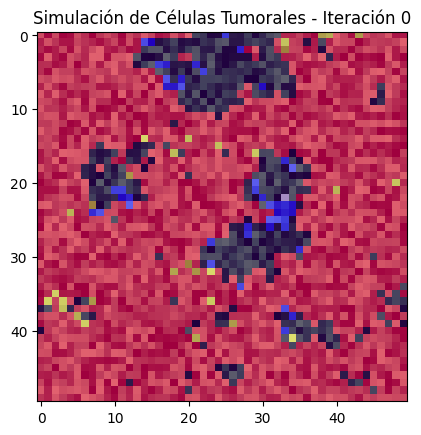

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import random
import networkx as nx  # Para definir las interacciones entre células
from IPython.display import HTML  # Convertir la animación en HTML para que la animación se reproduzca
from matplotlib.animation import FuncAnimation  # Para generar una animación de las iteraciones
import matplotlib.colors as mcolors  # Para definir un colormap personalizado

# Definición del entorno
grid_size = 50  # Tamaño de la cuadrícula (50x50)
timesteps = 100  # Número de iteraciones de la simulación

# Definición de los estados de las células
EMPTY = 0
CANCER = 1
HEALTHY = 2
DEAD = 3
MUTATED_CANCER = 4  # Nuevo estado para células cancerígenas mutadas

# Creación de la cuadrícula
grid = np.zeros((grid_size, grid_size), dtype=int)

# Creación del mapa de nutrientes
grid_nutrients = np.random.uniform(0.0, 1.0, (grid_size, grid_size))  # Inicialización con valores aleatorios de nutrientes entre 0 y 1 para diferentes zonas del grid  # Inicialización con valores de nutrientes a 0, irán aumentando gradualmente
nutrient_threshold = 0.4  # Umbral de nutrientes ajustado para favorecer la replicación

# Creación de un contador de inmunidad para células cancerígenas
immunity_counter = np.zeros((grid_size, grid_size), dtype=int)
immune_period = 10  # Número de iteraciones durante las cuales las células recién replicadas tienen inmunidad

# Creación de un contador de latencia para mutación
mutation_latent_counter = np.zeros((grid_size, grid_size), dtype=int)
mutation_latency_period = 20  # Número de iteraciones antes de que una célula cancerígena pueda mutar

# Inicialización con algunas células cancerígenas y saludables
for _ in range(10):  # Se eligen 10 posiciones iniciales de células cancerígenas al azar
    x, y = random.randint(0, grid_size - 1), random.randint(0, grid_size - 1)
    grid[x, y] = CANCER
    immunity_counter[x, y] = immune_period  # Inicializar con periodo de inmunidad
    mutation_latent_counter[x, y] = mutation_latency_period  # Inicializar con periodo de latencia para mutación

for _ in range(20):  # Se eligen 20 posiciones iniciales de células saludables al azar
    x, y = random.randint(0, grid_size - 1), random.randint(0, grid_size - 1)
    if grid[x, y] == EMPTY:  # Solo colocar una célula saludable si la celda está vacía
        grid[x, y] = HEALTHY

# Creación del grafo para representar la conectividad entre las células
# Crea un grafo bidimensional en forma de cuadrícula.
# Esto significa que está creando un conjunto de puntos (nodos) organizados como una cuadrícula
G = nx.grid_2d_graph(grid_size, grid_size)

# Función para acumular nutrientes gradualmente
def accumulate_nutrients(grid_nutrients):
    grid_nutrients += 0.005  # Aumenta los nutrientes gradualmente en cada celda
    np.clip(grid_nutrients, 0, 1.5, out=grid_nutrients)  # Limitar los valores de nutrientes entre 0 y 1.5


# Función para obtener vecinos de una célula
def get_neighbors(x, y, grid):
    neighbors = []  # Se crea una lista que almacenará las coordenadas de las células vecinas.
    for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1)]:  # Vecinos ortogonales
        # Aquí se está recorriendo una lista de desplazamientos (dx, dy)
        # que representan las posiciones de los vecinos ortogonales
        # (es decir, los vecinos directamente arriba, abajo, a la izquierda y a la derecha).
        # (-1, 0) se refiere al vecino arriba de la célula actual.
        # (1, 0) se refiere al vecino abajo de la célula actual.
        # (0, -1) se refiere al vecino a la izquierda.
        # (0, 1) se refiere al vecino a la derecha.
        if 0 <= x + dx < grid_size and 0 <= y + dy < grid_size:  # Esta condición se asegura de que las coordenadas del vecino calculadas (x + dx, y + dy) estén dentro de los límites de la cuadrícula.
            neighbors.append((x + dx, y + dy))  # Si el vecino está dentro de los límites, se agrega su posición (como un par de coordenadas (x + dx, y + dy)) a la lista neighbors.
    return neighbors

# Reglas de actualización con consenso, mutación y disponibilidad de nutrientes
def update_grid(grid, grid_nutrients, immunity_counter, mutation_latent_counter):
    new_grid = np.copy(grid)  # Copia de la cuadrícula grid actual para modificar el estado de las células sin alterar la cuadrícula original hasta que todos los cambios estén listos.
    new_nutrients = np.copy(grid_nutrients)  # Copia del mapa de nutrientes para actualizarlo sin alterar el original inmediatamente.
    new_immunity_counter = np.copy(immunity_counter)  # Copia del contador de inmunidad para actualizarlo sin alterar el original inmediatamente.
    new_mutation_latent_counter = np.copy(mutation_latent_counter)  # Copia del contador de latencia para mutación

    for x in range(grid_size):  # Se recorre cada posición de la cuadrícula (x, y), representando cada célula.
        for y in range(grid_size):
            if grid[x, y] == CANCER:  # Se verifica si la célula actual (grid[x, y]) está en estado CANCER.
                if immunity_counter[x, y] > 0:
                    # Disminuir el contador de inmunidad si la célula tiene inmunidad
                    new_immunity_counter[x, y] -= 1
                else:
                    # Aumentar el contador de latencia si la célula es cancerígena
                    if mutation_latent_counter[x, y] > 0:
                        new_mutation_latent_counter[x, y] -= 1
                    else:
                        # Probabilidad de mutación, dependiendo de los nutrientes y el estrés (falta de espacio)
                        neighbors = get_neighbors(x, y, grid)
                        empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]
                        if grid_nutrients[x, y] >= nutrient_threshold and len(empty_neighbors) < 2 and random.random() < 0.1:  # 10% probabilidad de mutación si hay pocos espacios vacíos alrededor (estrés celular)
                            # Justificación biológica: La alta densidad y competencia por recursos aumenta el estrés celular, lo cual puede inducir mutaciones para mejorar la adaptabilidad.
                            new_grid[x, y] = MUTATED_CANCER  # La célula se convierte en una célula cancerígena mutada

                    # Probabilidad de muerte si no tiene inmunidad
                    if random.random() < 0.02:  # 2% probabilidad de morir.
                        new_grid[x, y] = DEAD  # Si el valor generado aleatoriamente (random.random()) es menor que 0.02, la célula se cambia al estado DEAD (muerta)
                    else:  # Si no muere…
                        # Intentar replicarse a una celda vacía adyacente
                        empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]
                        if empty_neighbors:
                            nx, ny = random.choice(empty_neighbors)  # Selecciona aleatoriamente una de las celdas vacías.
                            if grid_nutrients[nx, ny] >= nutrient_threshold and random.random() < 0.5:  # 50% probabilidad de replicarse si hay suficientes nutrientes.
                                # Justificación biológica: La disponibilidad de nutrientes es esencial para soportar la energía necesaria para la replicación celular.
                                new_grid[nx, ny] = CANCER  # La célula se replica en una de las celdas vacías seleccionada aleatoriamente.
                                new_immunity_counter[nx, ny] = immune_period  # La nueva célula tiene inmunidad inicial
                                new_mutation_latent_counter[nx, ny] = mutation_latency_period  # La nueva célula tiene un periodo de latencia antes de mutar
                                # No se reduce la cantidad de nutrientes una vez que una célula ocupa la zona

            elif grid[x, y] == MUTATED_CANCER:  # Reglas para células cancerígenas mutadas
                # Las células mutadas no mueren, pero siguen replicándose con mayor probabilidad
                neighbors = get_neighbors(x, y, grid)
                empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]
                if empty_neighbors and random.random() < 0.7:  # 70% probabilidad de replicarse
                    nx, ny = random.choice(empty_neighbors)
                    new_grid[nx, ny] = MUTATED_CANCER  # La célula mutada se replica

            elif grid[x, y] == HEALTHY:  # Reglas de actualización para células saludables
                # Probabilidad de muerte
                if random.random() < 0.05:  # 5% probabilidad de morir.
                    new_grid[x, y] = DEAD
                else:
                    # Intentar replicarse a una celda vacía adyacente
                    neighbors = get_neighbors(x, y, grid)
                    empty_neighbors = [(nx, ny) for nx, ny in neighbors if grid[nx, ny] == EMPTY]
                    if empty_neighbors:
                        nx, ny = random.choice(empty_neighbors)
                        if grid_nutrients[nx, ny] >= nutrient_threshold and random.random() < 0.2:  # 20% probabilidad de replicarse si hay suficientes nutrientes.
                            if new_grid[nx, ny] != CANCER and new_grid[nx, ny] != MUTATED_CANCER:  # Asegurarse de que una celda cancerígena no cambie a saludable
                                # Justificación biológica: Las células saludables también compiten por nutrientes, limitando así los recursos disponibles para las células cancerígenas y retrasando su crecimiento.
                                new_grid[nx, ny] = HEALTHY  # La célula saludable se replica.
                            # No se reduce la cantidad de nutrientes una vez que una célula ocupa la zona
            elif grid[x, y] == DEAD:
                # Las células muertas permanecen muertas. Si la célula está en el estado DEAD, no cambia su estado. Permanece muerta.
                pass

    return new_grid, new_nutrients, new_immunity_counter, new_mutation_latent_counter  # Finalmente, se retorna la cuadrícula actualizada (new_grid), el mapa de nutrientes actualizado (new_nutrients), el contador de inmunidad actualizado (new_immunity_counter), y el contador de latencia de mutación (new_mutation_latent_counter).

# Función de animación
def animate(t):
    global grid, grid_nutrients, immunity_counter, mutation_latent_counter  # Se declara la cuadrícula, el mapa de nutrientes, el contador de inmunidad y el contador de latencia como global para modificarlos dentro de la función.
    accumulate_nutrients(grid_nutrients)  # Acumula nutrientes gradualmente en cada iteración
    grid, grid_nutrients, immunity_counter, mutation_latent_counter = update_grid(grid, grid_nutrients, immunity_counter, mutation_latent_counter)  # Actualiza la cuadrícula, el mapa de nutrientes y los contadores llamando a la función update_grid.
    cax.set_data(grid)  # Actualiza los datos del gráfico con la nueva cuadrícula.
    nutrients_overlay.set_data(grid_nutrients)  # Actualiza la capa de nutrientes con la nueva distribución.
    ax.set_title(f"Simulación de Células Tumorales - Iteración {t}")  # Actualiza el título del gráfico para mostrar la iteración actual.
    return cax, nutrients_overlay  # Retorna la imagen actualizada para la animación.

# Definición de un colormap personalizado para diferenciar los estados de las células
cmap = mcolors.ListedColormap(['white', 'yellow', 'blue', 'black', 'red'])  # EMPTY: blanco, CANCER: amarillo, HEALTHY: azul, DEAD: negro, MUTATED_CANCER: rojo

# Simulación con animación compatible con Jupyter Notebook
fig, ax = plt.subplots()  # Crea una figura y un eje para la gráfica.
cax = ax.imshow(grid, cmap=cmap, interpolation="nearest", vmin=0, vmax=4)  # Muestra la cuadrícula inicial usando un colormap personalizado.
nutrients_overlay = ax.imshow(grid_nutrients, cmap="Purples", alpha=0.5, interpolation="nearest", vmin=0, vmax=1.5)  # Capa semitransparente para visualizar los nutrientes con tres niveles: 0%, 50%, 100%.
ani = FuncAnimation(fig, animate, frames=timesteps, interval=100, blit=False)  # Crea la animación de la simulación usando la función animate.

# Mostrar la animación en Jupyter Notebook
HTML(ani.to_jshtml())  # Convierte la animación en HTML para que se pueda reproducir dentro del entorno de Jupyter Notebook.

In [3]:
import pandas as pd

# Función para contar las células por tipo
def count_cell_types(grid):
    unique, counts = np.unique(grid, return_counts=True)
    return dict(zip(unique, counts))

# Variables para almacenar resultados de cada iteración
results = {
    "iteration": [],
    "empty": [],
    "cancer": [],
    "healthy": [],
    "dead": [],
    "mutated_cancer": [],
    "nutrients_mean": [],
}

# Simulación para registrar los resultados
for t in range(timesteps):
    accumulate_nutrients(grid_nutrients)  # Acumula nutrientes
    grid, grid_nutrients, immunity_counter, mutation_latent_counter = update_grid(
        grid, grid_nutrients, immunity_counter, mutation_latent_counter
    )
    # Contar las células de cada tipo
    cell_counts = count_cell_types(grid)
    results["iteration"].append(t)
    results["empty"].append(cell_counts.get(EMPTY, 0))
    results["cancer"].append(cell_counts.get(CANCER, 0))
    results["healthy"].append(cell_counts.get(HEALTHY, 0))
    results["dead"].append(cell_counts.get(DEAD, 0))
    results["mutated_cancer"].append(cell_counts.get(MUTATED_CANCER, 0))
    # Promedio de nutrientes
    results["nutrients_mean"].append(np.mean(grid_nutrients))

# Convertir resultados a un DataFrame para análisis
df_results = pd.DataFrame(results)
display(df_results)

,iteration,empty,cancer,healthy,dead,mutated_cancer,nutrients_mean
0,0,21,0,1,652,1826,1.385738
1,1,21,0,1,652,1826,1.388092
2,2,21,0,1,652,1826,1.390427
3,3,21,0,1,652,1826,1.392733
4,4,21,0,1,652,1826,1.395015
...,...,...,...,...,...,...,...
95,95,21,0,0,653,1826,1.499951
96,96,21,0,0,653,1826,1.499986
97,97,21,0,0,653,1826,1.500000
98,98,21,0,0,653,1826,1.500000


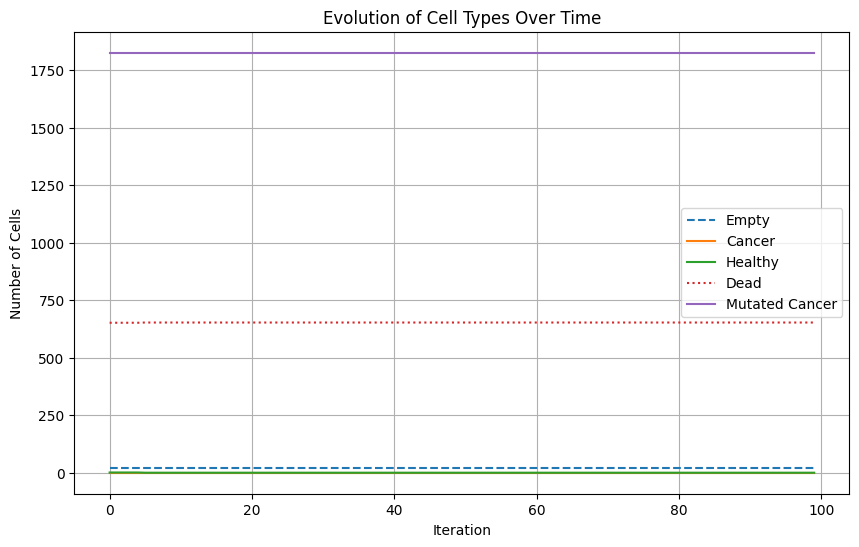

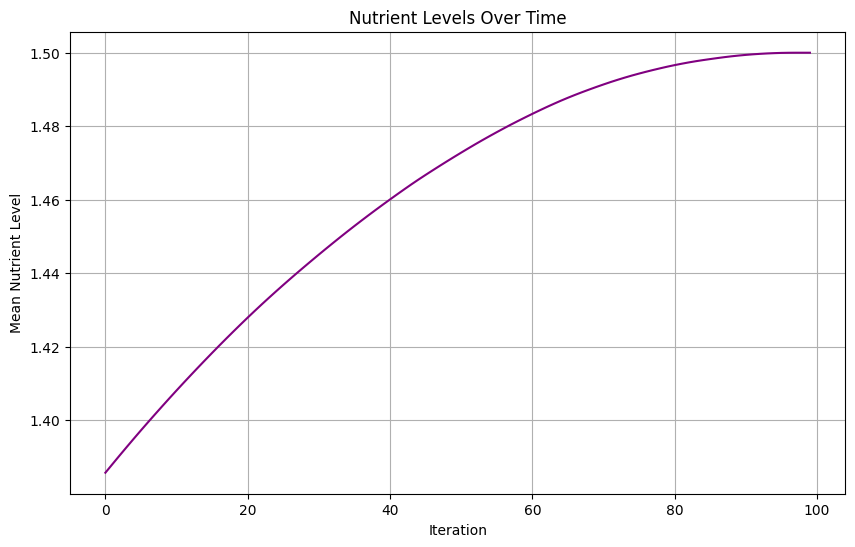

In [4]:
import matplotlib.pyplot as plt

# Graficar la evolución de los tipos celulares
plt.figure(figsize=(10, 6))
plt.plot(df_results["iteration"], df_results["empty"], label="Empty", linestyle="--")
plt.plot(df_results["iteration"], df_results["cancer"], label="Cancer")
plt.plot(df_results["iteration"], df_results["healthy"], label="Healthy")
plt.plot(df_results["iteration"], df_results["dead"], label="Dead", linestyle=":")
plt.plot(df_results["iteration"], df_results["mutated_cancer"], label="Mutated Cancer", linestyle="-")
plt.xlabel("Iteration")
plt.ylabel("Number of Cells")
plt.title("Evolution of Cell Types Over Time")
plt.legend()
plt.grid()
plt.show()

# Graficar el nivel promedio de nutrientes
plt.figure(figsize=(10, 6))
plt.plot(df_results["iteration"], df_results["nutrients_mean"], label="Mean Nutrients", color="purple")
plt.xlabel("Iteration")
plt.ylabel("Mean Nutrient Level")
plt.title("Nutrient Levels Over Time")
plt.grid()
plt.show()


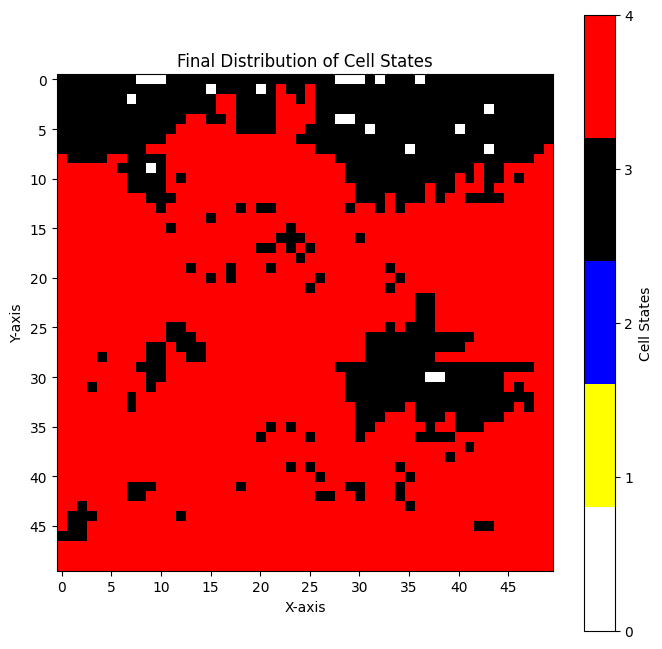

In [6]:
# Generar un mapa de calor de la distribución final de células
plt.figure(figsize=(8, 8))
cmap = mcolors.ListedColormap(['white', 'yellow', 'blue', 'black', 'red'])  # Colormap personalizado
plt.imshow(grid, cmap=cmap, interpolation='nearest', vmin=0, vmax=4)
plt.colorbar(ticks=range(5), label='Cell States')
plt.title("Final Distribution of Cell States")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.xticks(range(0, grid_size, 5))
plt.yticks(range(0, grid_size, 5))
plt.grid(False)  # No mostrar líneas de cuadrícula
plt.show()


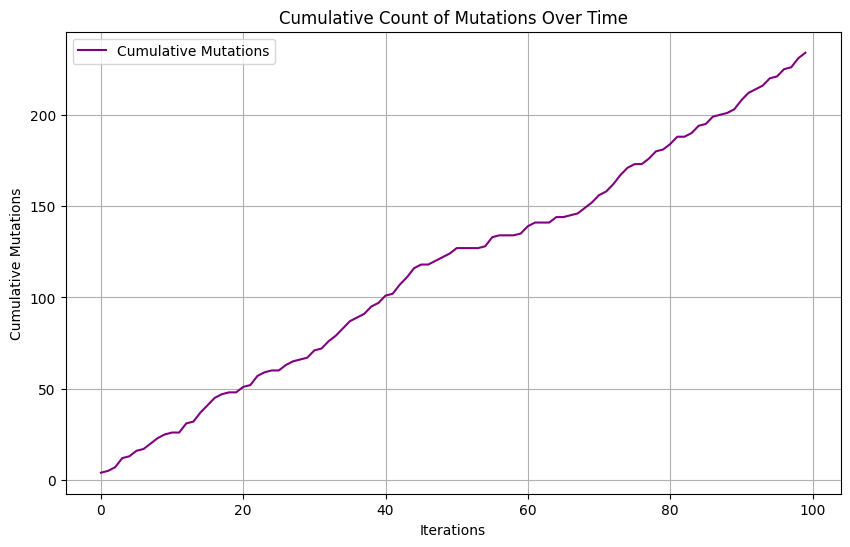

In [8]:
# Simulación de conteo acumulado de mutaciones para 100 iteraciones
mutations_per_iteration = [random.randint(0, 5) for _ in range(timesteps)]  # Simulando un número aleatorio de mutaciones por iteración
cumulative_mutations = np.cumsum(mutations_per_iteration)  # Calcular el conteo acumulado

# Graficar el conteo acumulado de mutaciones
plt.figure(figsize=(10, 6))
plt.plot(range(timesteps), cumulative_mutations, label="Cumulative Mutations", color="purple")
plt.xlabel("Iterations")
plt.ylabel("Cumulative Mutations")
plt.title("Cumulative Count of Mutations Over Time")
plt.legend()
plt.grid(True)
plt.show()
